<a href="https://colab.research.google.com/github/jawahirkhaleel/-jawahirkhaleel-/blob/main/heatwave.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install --upgrade xee

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 476.4/476.4 kB 9.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 19.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 22.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.3/43.3 kB 3.2 MB/s eta 0:00:00
  Attempting uninstall: earthengine-api
    Found existing installation: earthengine-api 1.5.24
    Uninstalling earthengine-api-1.5.24:
      Successfully uninstalled earthengine-api-1.5.24


In [2]:
!pip install -U geemap


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 64.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 73.0 MB/s eta 0:00:00
  Attempting uninstall: geemap
    Found existing installation: geemap 0.35.3
    Uninstalling geemap-0.35.3:
      Successfully uninstalled geemap-0.35.3


In [3]:
import ee

In [4]:
ee.Authenticate()
ee.Initialize(
    project = 'ee-jawahirkhaleel05',
    opt_url = 'https://earthengine-highvolume.googleapis.com'
)


In [5]:
import geemap

In [6]:
map = geemap.Map()
map

Map(center=[0, 0], controls=(WidgetControl(options=['position', 'transparent_bg'], position='topright', transp…

In [7]:
roi = map.draw_last_feature.geometry()
roi

ee.Geometry({
  "functionInvocationValue": {
    "functionName": "Feature.geometry",
    "arguments": {
      "feature": {
        "functionInvocationValue": {
          "functionName": "Feature",
          "arguments": {
            "geometry": {
              "functionInvocationValue": {
                "functionName": "GeometryConstructors.Polygon",
                "arguments": {
                  "coordinates": {
                    "constantValue": [
                      [
                        [
                          62.050781,
                          26.194877
                        ],
                        [
                          63.105469,
                          27.371767
                        ],
                        [
                          62.314453,
                          28.613459
                        ],
                        [
                          61.435547,
                          29.61167
                        ],
                        [
                          61.611328,
                          31.052934
                        ],
                        [
                          60.732422,
                          32.546813
                        ],
                        [
                          60.644531,
                          34.161818
                        ],
                        [
                          61.347656,
                          35.817813
                        ],
                        [
                          60.029297,
                          37.230328
                        ],
                        [
                          57.65625,
                          37.996163
                        ],
                        [
                          54.755859,
                          37.579413
                        ],
                        [
                          52.558594,
                          36.949892
                        ],
                        [
                          50.800781,
                          37.09024
                        ],
                        [
                          49.394531,
                          38.134557
                        ],
                        [
                          48.427734,
                          39.300299
                        ],
                        [
                          46.582031,
                          39.368279
                        ],
                        [
                          44.472656,
                          39.368279
                        ],
                        [
                          44.384766,
                          37.857507
                        ],
                        [
                          45.175781,
                          36.809285
                        ],
                        [
                          45.791016,
                          35.532226
                        ],
                        [
                          45.527344,
                          33.72434
                        ],
                        [
                          46.933594,
                          32.694866
                        ],
                        [
                          47.8125,
                          31.653381
                        ],
                        [
                          48.955078,
                          30.372875
                        ],
                        [
                          50.712891,
                          29.764377
                        ],
                        [
                          51.064453,
                          28.149503
                        ],
                        [
                          53.173828,
                          27.683528
                        ],
                        [
                          54.316406,
                          27.059126
                     

In [8]:
era5 = (
    ee.ImageCollection("ECMWF/ERA5/DAILY")
    .filterDate('2010','2020')
    .select(['maximum_2m_air_temperature'],['tmax'])
)

In [9]:
era5

In [10]:
import xarray as xr

In [11]:
ds = xr.open_dataset(
    era5,
    engine = 'ee',
    crs = 'EPSG:4326',
    scale = 0.3,
    geometry = roi
)

In [12]:
ds =  ds.sortby('time') - 273.15

In [13]:
tmax = ds.tmax
tmax.attrs['units'] = 'degC'

In [14]:
tmax


<xarray.DataArray 'tmax' (time: 3652, lon: 62, lat: 47)> Size: 43MB
array([[[19.514313  , 18.967346  , 18.563293  , ...,  1.6750183 ,
          3.2867126 ,  7.063202  ],
        [19.147125  , 18.627808  , 18.13617   , ...,  4.5358276 ,
          6.1828613 ,  8.694885  ],
        [18.710785  , 18.087006  , 17.928741  , ...,  8.968384  ,
          8.501312  ,  9.701233  ],
        ...,
        [24.15738   , 23.386078  , 22.003326  , ..., 15.574951  ,
         14.805206  , 13.465454  ],
        [24.15738   , 23.369202  , 21.708313  , ..., 16.556732  ,
         15.912964  , 14.607025  ],
        [24.280273  , 23.72409   , 21.545471  , ..., 16.381561  ,
         16.115784  , 15.253845  ]],

       [[19.723328  , 19.92804   , 19.720215  , ...,  3.9640808 ,
          6.6549683 , 10.033386  ],
        [19.407684  , 19.592072  , 19.201416  , ...,  7.4378357 ,
         10.030273  , 11.947632  ],
        [19.201416  , 19.057648  , 18.895142  , ..., 12.496124  ,
         13.23526   , 12.566437  ],
...
        [27.13919   , 25.989655  , 24.966125  , ...,  8.803223  ,
          8.386017  ,  7.563629  ],
        [26.25827   , 25.51242   , 24.196259  , ...,  8.956299  ,
          8.61264   ,  7.805237  ],
        [26.016663  , 25.386353  , 23.543427  , ...,  9.145386  ,
          8.803223  ,  7.9328003 ]],

       [[23.053223  , 22.038269  , 21.633759  , ...,  0.72991943,
          1.5112305 ,  4.665619  ],
        [23.292725  , 22.299683  , 21.56073   , ...,  2.9336243 ,
          3.7017822 ,  6.951111  ],
        [23.681183  , 22.271942  , 21.573883  , ...,  6.239929  ,
          6.768585  ,  9.12854   ],
        ...,
        [27.09555   , 26.47345   , 25.281769  , ..., 10.134735  ,
          9.689331  ,  8.648071  ],
        [26.540619  , 26.236847  , 24.704926  , ..., 10.331879  ,
          9.914215  ,  9.330078  ],
        [26.496796  , 26.526001  , 24.350037  , ..., 10.454559  ,
         10.22821   ,  9.709778  ]]], dtype=float32)
Coordinates:
  * time     (time) datetime64[ns] 29kB 2010-01-01 2010-01-02 ... 2019-12-31
  * lon      (lon) float64 496B 44.53 44.83 45.13 45.43 ... 62.23 62.53 62.83
  * lat      (lat) float64 376B 25.47 25.77 26.07 26.37 ... 38.67 38.97 39.27
Attributes:
    id:             tmax
    data_type:      {'type': 'PixelType', 'precision': 'float'}
    dimensions:     [1440, 721]
    crs:            EPSG:4326
    crs_transform:  [0.25, 0, -180, 0, -0.25, 90]
    units:          degC

In [15]:
!pip install xclim

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 382.6/382.6 kB 20.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.2/194.2 kB 16.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.4/78.4 kB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 56.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 306.8/306.8 kB 21.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.2/58.2 kB 5.0 MB/s eta 0:00:00


In [16]:
from xclim.indicators.atmos import heat_wave_index


In [17]:
hw = heat_wave_index(
    tasmax = ds.tmax,
    thresh = '25 degC',
    window = 5,
    freq = 'YS'
)

In [18]:
import matplotlib.pyplot as plt

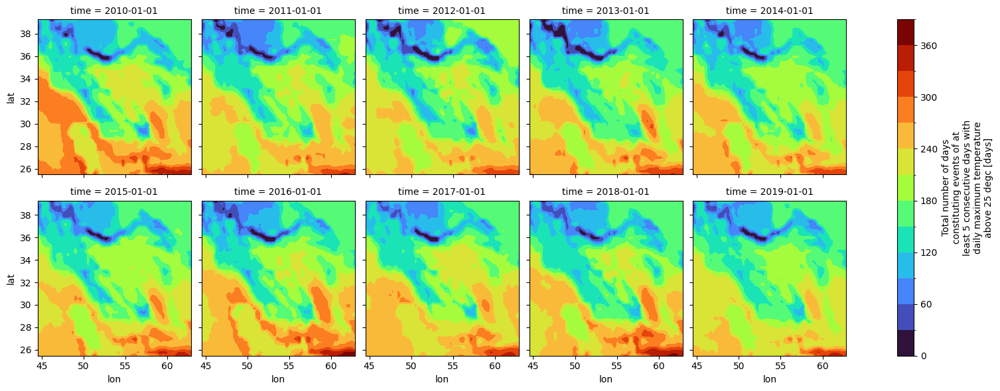

In [19]:
hw.plot.contourf(
    x = 'lon', y = 'lat', col = 'time', col_wrap = 5, cmap ='turbo', levels = 15
)

In [20]:
plt.savefig('hw_index.png', dpi = 360, bbox_inches = 'tight')

<Figure size 640x480 with 0 Axes>

In [26]:
point = hw.sel(lat = 32.987506357765504, lon =53.98152945062926, method = 'nearest')

In [27]:
df = point.to_dataframe().heat_wave_index
df

,heat_wave_index
time,
2010-01-01,213.0
2011-01-01,207.0
2012-01-01,199.0
2013-01-01,201.0
2014-01-01,196.0
2015-01-01,201.0
2016-01-01,208.0
2017-01-01,215.0
2018-01-01,199.0


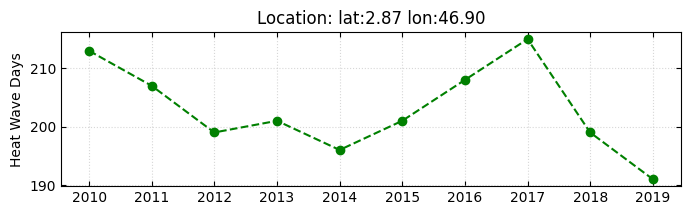

In [49]:
fig, ax = plt.subplots(figsize = (8,2))
ax.plot(df.index, df, marker = 'o', color = 'green', ls = '--')
ax.set_ylabel('Heat Wave Days')
ax.grid(ls = ':', alpha = 0.5)
ax.set_title('Location:'+' lat:2.87' + ' lon:46.90')
ax.tick_params(axis = 'both', direction = 'in', top = True, right = True)
plt.savefig('hw_plot.png', dpi = 360, bbox_inches = 'tight')